In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

%matplotlib inline
import matplotlib.pyplot as plt

from PIL import Image
from matplotlib.pyplot import imshow
import matplotlib.cm as cm

import numpy as np

import skimage.transform
from scipy import ndimage
import scipy.misc

def image_show(image_path):
  imshow(np.asarray(Image.open(image_path, 'r')))
  plt.axis('off')
  plt.show()

import tensorflow as tf
flags = tf.app.flags
import gflags  
flags = gflags
FLAGS = flags.FLAGS

#flags.DEFINE_string('model_dir', '/home/gezi/new/temp/image-caption/ai-challenger/model/showattentell.finetune/', '')
  
import sys, os, math
import gezi, melt
import numpy as np

from deepiu.util import algos_factory
from deepiu.seq2seq.rnn_decoder import SeqDecodeMethod

#debug
from deepiu.util import text2ids

TEXT_MAX_WORDS = 100    
decode_max_words = 20


from deepiu.util import ids2text
vocab_path = '/home/gezi/new/temp/image-caption/ai-challenger/tfrecord/seq-basic-finetune/vocab.txt'
ids2text.init(vocab_path)

image_dir = image_dir = '/home/gezi/data2/data/ai_challenger/image_caption/pic/'
image_file = '6275b5349168ac3fab6a493c509301d023cf39d3.jpg'
image_path = os.path.join(image_dir, image_file)
image_checkpoint_file = '/home/gezi/data/image_model_check_point/inception_v4.ckpt'
net = melt.image.get_imagenet_from_checkpoint(image_checkpoint_file)
print('image net', net, 'net.default_image_size', net.default_image_size)
FLAGS.image_model_name = FLAGS.image_model_name or net.name
FLAGS.image_height = FLAGS.image_height or net.default_image_size
FLAGS.image_width = FLAGS.image_width or net.default_image_size
image_model_name = FLAGS.image_model_name
print('image_model_name', image_model_name)

model_dir = '/home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.bahdanau.inceptionV4.finetune/epoch/model.ckpt-22.40-734944'

#FLAGS.model_dir = model_dir

if not melt.varname_in_checkpoint(image_model_name, model_dir):
  image_model = melt.image.ImageModel(image_model_checkpoint_path)
else:
  image_model = None

print('image_model', image_model)

import libpinyin
pinyin = libpinyin.Pinyin()
pinyin.Load('./data/pinyin/')

tensorflow_version: 1.5.0-dev20171205
ERROR:root:Trying to access flag num_reserved_ids before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagAccessError: Trying to access flag num_reserved_ids before flags were parsed.
ERROR:root:Trying to access flag num_reserved_ids before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagAccessError: Trying to access flag num_reserved_ids before flags were parsed.


INFO:tensorflow:Initializing vocabulary from file: /home/gezi/new/temp/image-caption/ai-challenger/tfrecord/seq-basic-finetune/vocab.txt


INFO:tensorflow:Initializing vocabulary from file: /home/gezi/new/temp/image-caption/ai-challenger/tfrecord/seq-basic-finetune/vocab.txt


INFO:tensorflow:Created vocabulary with 10148 words


INFO:tensorflow:Created vocabulary with 10148 words
ERROR:root:Trying to access flag vocab_size before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagAccessError: Trying to access flag vocab_size before flags were parsed.
ERROR:root:Trying to access flag num_reserved_ids before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagAccessError: Trying to access flag num_reserved_ids before flags were parsed.
ENCODE_UNK 1
ERROR:root:Trying to access flag image_model_name before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.Unparsed

image net <function inception_v4 at 0x7f5308918a28> net.default_image_size 299
image_model_name InceptionV4
image_model None


In [2]:
if 'coverage' in model_dir:
  FLAGS.coverage_attention_wrapper = True

FLAGS.image_encoder = 'Rnn'
FLAGS.showtell_encode_scope = 'encode'
FLAGS.showtell_decode_scope = 'decode'
FLAGS.image_endpoint_feature_name = 'attention'
FLAGS.image_checkpoint_file = image_checkpoint_file
FLAGS.pre_calc_image_feature = False
FLAGS.finetune_image_model = True 
FLAGS.image_features_batch_norm = True 
FLAGS.emb_dim = 512 
FLAGS.rnn_hidden_size = 512 
FLAGS.alignment_history = True

FLAGS.image_attention_size = FLAGS.image_attention_size or melt.image.get_num_features(FLAGS.image_model_name)
FLAGS.image_feature_len = FLAGS.image_feature_len or melt.image.get_feature_dim(FLAGS.image_model_name) * FLAGS.image_attention_size

beam_size = 10
length_normalization_factor = 0.25

ERROR:root:Trying to access flag image_attention_size before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagAccessError: Trying to access flag image_attention_size before flags were parsed.
ERROR:root:Trying to access flag image_model_name before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagAccessError: Trying to access flag image_model_name before flags were parsed.
ERROR:root:Trying to access flag image_feature_len before flags were parsed.
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/gflags/flagvalues.py", line 535, in __getattr__
    raise exceptions.UnparsedFlagAccessError(error_message)
UnparsedFlagA

In [3]:
# algo = 'show_and_tell'
# global_scope = algo
# main_scope = 'main'
# melt.apps.image_processing.init(FLAGS.image_model_name)
# with tf.variable_scope(global_scope):
#   with tf.variable_scope(main_scope):
#     predictor =  algos_factory.gen_predictor(algo)
#     predictor.init_predict_text(decode_method=SeqDecodeMethod.ingraph_beam, 
#                                 beam_size=beam_size,
#                                 length_normalization_factor=length_normalization_factor,
#                                 logprobs_history=True,
#                                 alignment_history=True)  

# predictor.load(FLAGS.model_dir) 

In [4]:
predictor = melt.Predictor(model_dir)

class Predictor(object):
  def __init__(self, predictor):
    self._predictor = predictor
    self._sess = sess = predictor.sess
    self._graph = graph = predictor.graph
    self._ops = [graph.get_collection(x)[-1] for x in ['beam_text', 'beam_text_score', 'beam_logprobs_history', 'beam_alignment_history']]
  def predict_text(self, feature):
    return self._sess.run(self._ops, feed_dict={self._graph.get_collection('feed')[-1]: feature})
  
predictor = Predictor(predictor)

load frozen graph from /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.bahdanau.inceptionV4.finetune/epoch/model.ckpt-22.40-734944.pb with mapfile /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.bahdanau.inceptionV4.finetune/epoch/model.ckpt-22.40-734944.map start


Instructions for updating:
Please file an issue at https://github.com/tensorflow/tensorflow/issues if you depend on this feature.


Instructions for updating:
Please file an issue at https://github.com/tensorflow/tensorflow/issues if you depend on this feature.
load frozen graph from /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.bahdanau.inceptionV4.finetune/epoch/model.ckpt-22.40-734944.pb with mapfile /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.bahdanau.inceptionV4.finetune/epoch/model.ckpt-22.40-734944.map duration: 10.8411149979


In [5]:
def simple_predict(image_path, predictor):
  timer = gezi.Timer('beam search using time')
  img = melt.read_image(image_path)
  if image_model:
    #attention model gen features only
    feature = image_model.gen_features(img) if image_model is not None else img
  else:
    feature = [img]    
  #texts_list, scores_list = predictor.predict_text(feature)
  #timer.print()
  logprobs_history = None 
  alignment_history = None

  l = predictor.predict_text(feature)
  timer.print()
  texts_list, scores_list= l[0], l[1]
  try:
    logprobs_history = l[2]
    alignment_history = l[3]
  except Exception:
    pass

  #print(alignment_history)

  texts = texts_list[0]
  scores = scores_list[0]
  if logprobs_history is not None:
    logprobs = logprobs_history[0]
  else:
    logprobs = [None] * len(texts)
  if alignment_history is not None:
    alignments = alignment_history[0]
  else:
    alignments = [None] * len(texts)
    
  logprob = None 
  alignment = None 
    
  for text, score, logprob, alignment in zip(texts, scores, logprobs, alignments):
    print('align shape', alignment.shape)
    print(ids2text.ids2text(text), score)
    print(text, len(text))
    if logprob is not None:
      print(map(math.exp, logprob))
    if alignment is not None:
      print(alignment)
      print(alignment[10], alignment[11], alignment[12])


In [6]:
#simple_predict(image_path, predictor)

In [7]:
def predict(image_path, predictor, length_normalization_factor=0.25, num_show=1):
  img = melt.read_image(image_path)
  if image_model:
    feature = image_model.gen_feature(img) if image_model is not None else img
  else:
    feature = [img]

  timer = gezi.Timer()
  texts, scores, logprobs_history, alignment_history = predictor.predict_text(feature)
  for i, (text, score, logprob, alignment) in enumerate(zip(texts[0], scores[0], logprobs_history[0], alignment_history[0])):
    print(ids2text.ids2text(text), score)

    # Plot images with attention weights
    words = ids2text.ids2words(text) 
    img = ndimage.imread(image_path)
    
    num_features = melt.image.get_num_features(image_model_name)
    dim = int(np.sqrt(num_features))
    #print('dim:', dim)

    n_words = len(words)
    n_words += 1 #for ori image
    w = np.round(np.sqrt(n_words))
    h = np.ceil(np.float32(n_words) / w)
    
    #print(n_words, w, h)
    IMAGE_SIZE = (14, 10)
    plt.figure(figsize=IMAGE_SIZE)
    plt.subplot(w, h, 1)
    plt.imshow(img)
    plt.axis('off')

    #img = scipy.misc.imresize(img, (dim, dim))  

    #smooth = True  #TODO smooth = Ture seems not work not back ground pic
    smooth = False
    if i < 10:  
      #print('probs', [math.exp(x) for x in logprob])
      for j in range(len(words)):
        #if i == 0:
        #  print(i, j, words[j], alignment[j])
        plt.subplot(w, h, j + 2)
        lab = pinyin.Convert(words[j].decode('utf8').encode('gbk'))
        lab += '(%0.2f)'%math.exp(logprob[j])
        plt.text(0, 1, lab, backgroundcolor='white', fontsize=10)
        plt.text(0, 1, lab, color='black', fontsize=10)
        plt.imshow(img)
        if smooth:
          alpha_img = skimage.transform.pyramid_expand(alignment[j].reshape(dim, dim), upscale=16, sigma=20)
        else:
          alpha_img = skimage.transform.resize(alignment[j].reshape(dim, dim), [img.shape[0], img.shape[1]])
        plt.imshow(alpha_img, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
      plt.show()
      #plt.savefig('test%d.pdf'%i)

    print('beam search using time(ms):', timer.elapsed_ms())

In [ ]:
%%html
<style>
.output_wrapper, .output {
    height:auto !important;
    max-height:100000px;  /* your desired max-height here */
}
.output_scroll {
    box-shadow:none !important;
    webkit-box-shadow:none !important;
}
</style>

image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 0151c1c75a0cbc9ca5a5bcf99bd02939b3cb7580


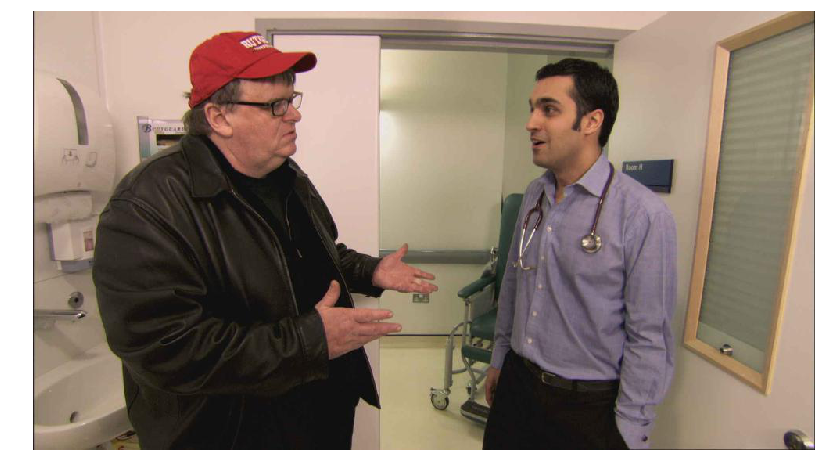

一个 戴着 眼镜 的 男人 和 一个 戴着 眼镜 的 男人 在 房间 里 交谈 </S> 0.0436786


/usr/local/lib/python2.7/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


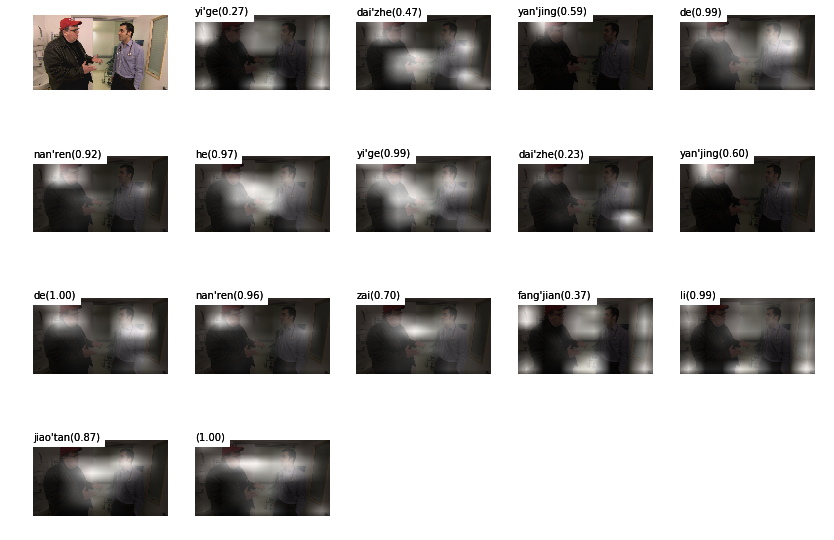

beam search using time(ms): 5826.38812065
一个 戴着 帽子 的 男人 和 一个 戴着 眼镜 的 男人 在 房间 里 交谈 </S> 0.0343587


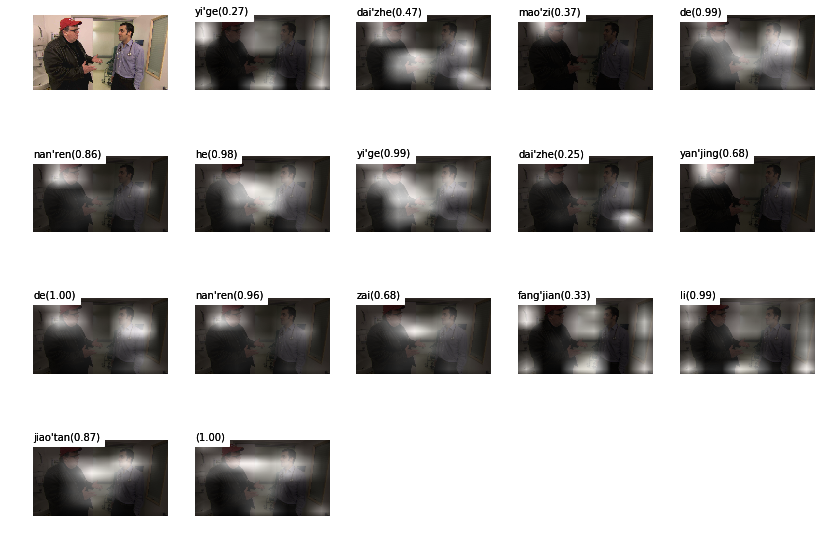

beam search using time(ms): 1559.08894539
一个 戴着 眼镜 的 男人 和 一个 戴着 眼镜 的 男人 在 屋子里 交谈 </S> 0.0291119


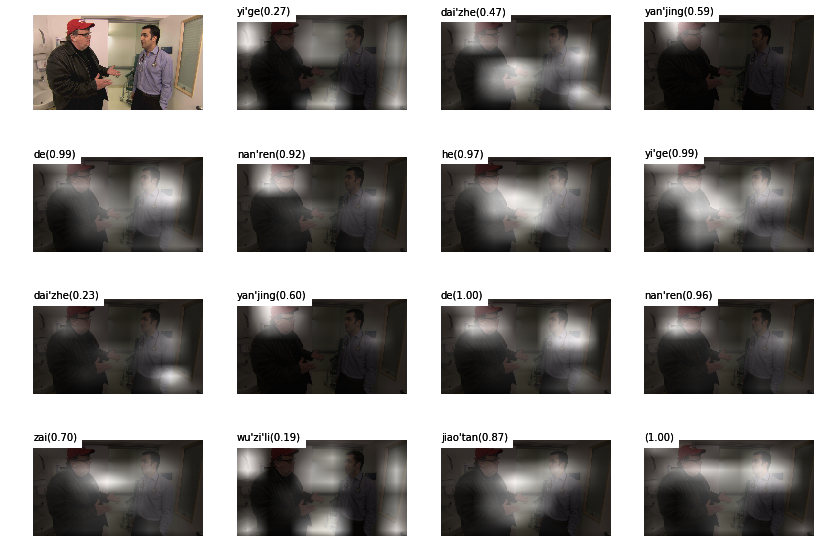

beam search using time(ms): 1571.89798355
一个 戴着 眼镜 的 男人 和 一个 戴着 帽子 的 男人 在 房间 里 交谈 </S> 0.0263184


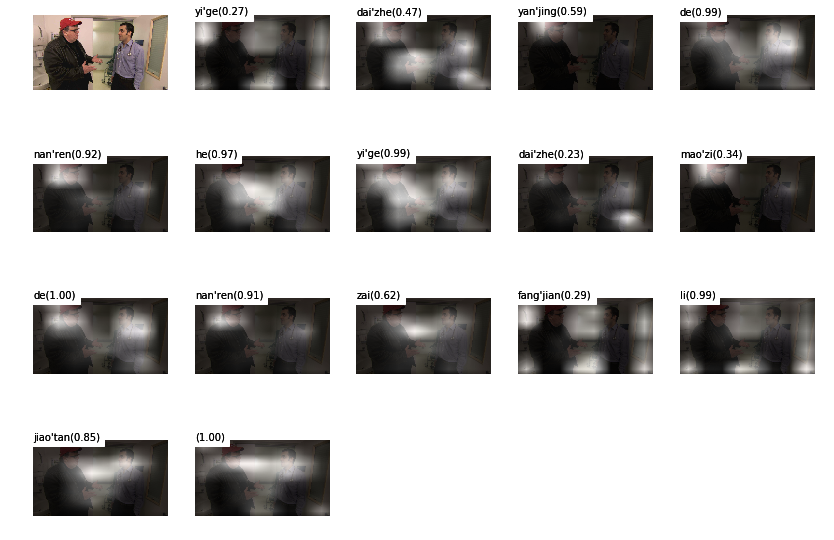

beam search using time(ms): 1563.06600571
一个 戴着 帽子 的 男人 和 一个 戴着 眼镜 的 男人 在 屋子里 交谈 </S> 0.0242585


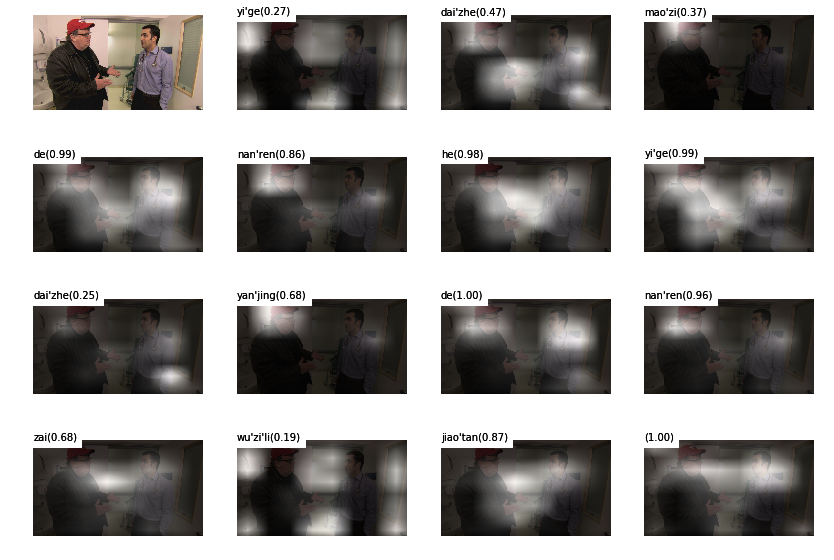

beam search using time(ms): 1566.83206558
一个 戴着 眼镜 的 男人 和 一个 戴着 眼镜 的 男人 站 在 房间 里 交谈 </S> 0.0228689


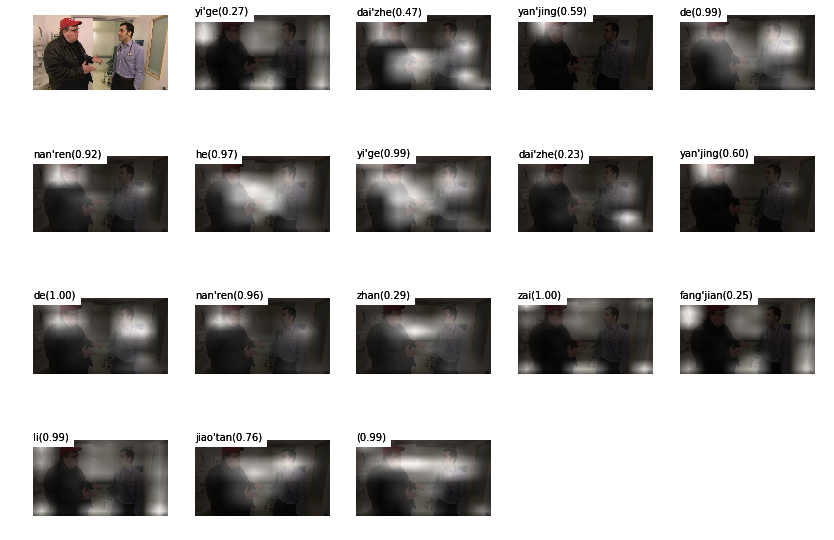

beam search using time(ms): 1648.53787422
一个 戴着 眼镜 的 男人 和 一个 戴着 眼镜 的 男人 在 室内 交谈 </S> 0.0215999


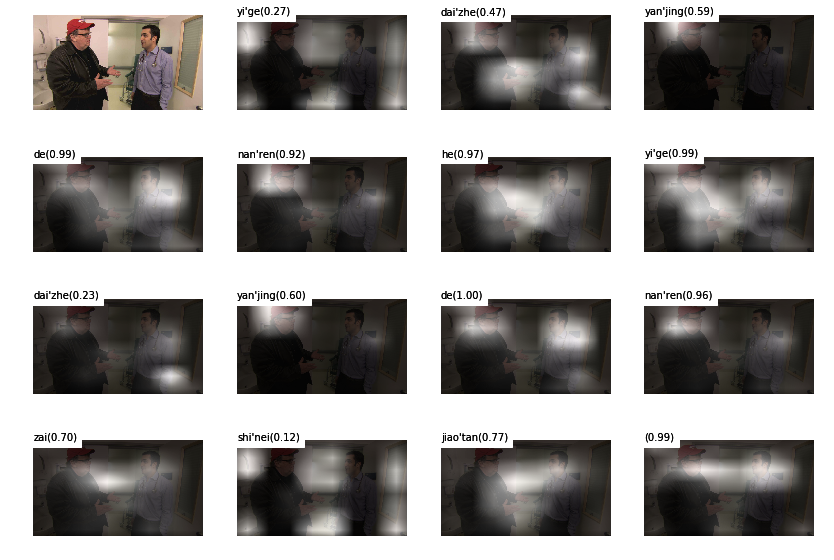

beam search using time(ms): 1565.38796425
一个 戴着 眼镜 的 男人 和 一个 戴着 眼镜 的 男人 站 在 屋子里 交谈 </S> 0.0187909


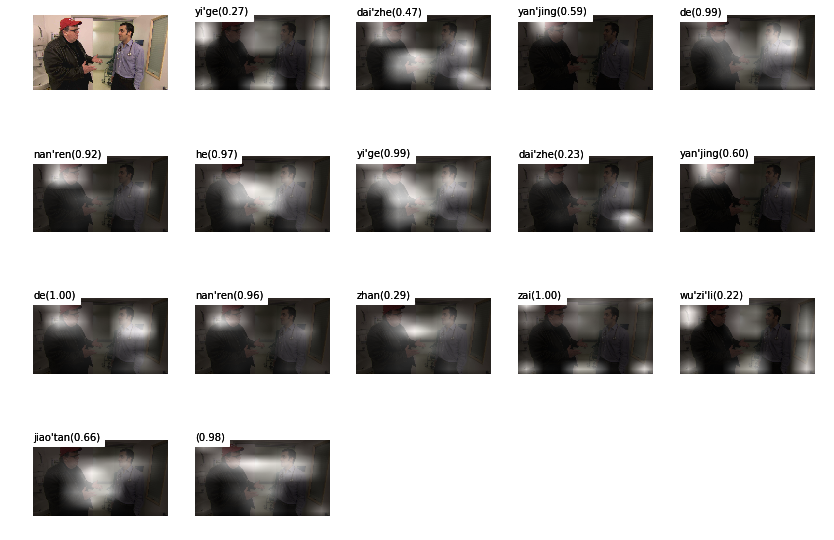

beam search using time(ms): 1557.62004852
一个 戴着 帽子 的 男人 和 一个 戴着 眼镜 的 男人 站 在 房间 里 交谈 </S> 0.018647


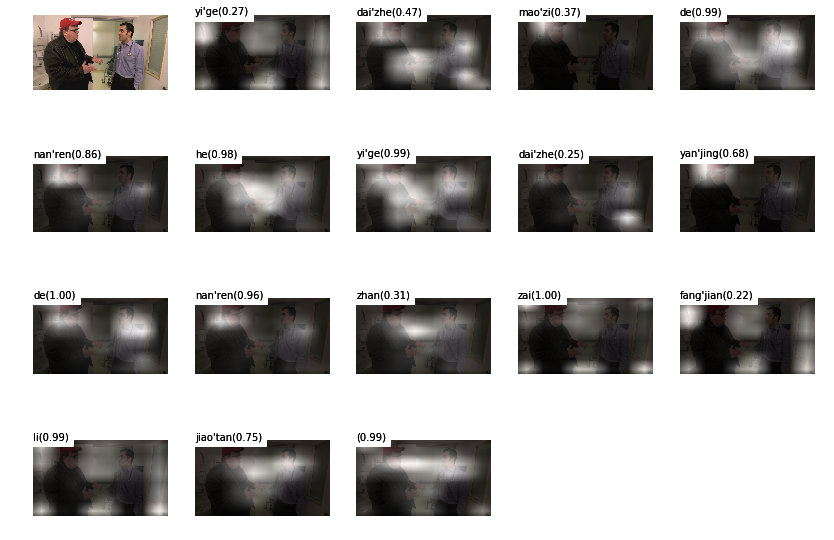

beam search using time(ms): 1648.19216728
房间 里 有 一个 抬起 右手 的 男人 在 和 一个 戴着 眼镜 的 男人 交谈 </S> 0.0185363


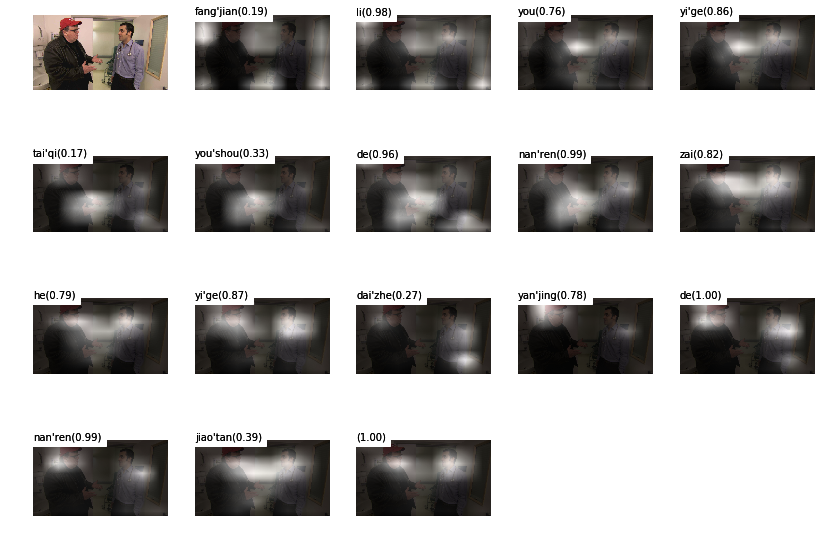

beam search using time(ms): 1645.84493637
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: bc2797404d29cfd70d2b8f3bc1072f21e4acc797


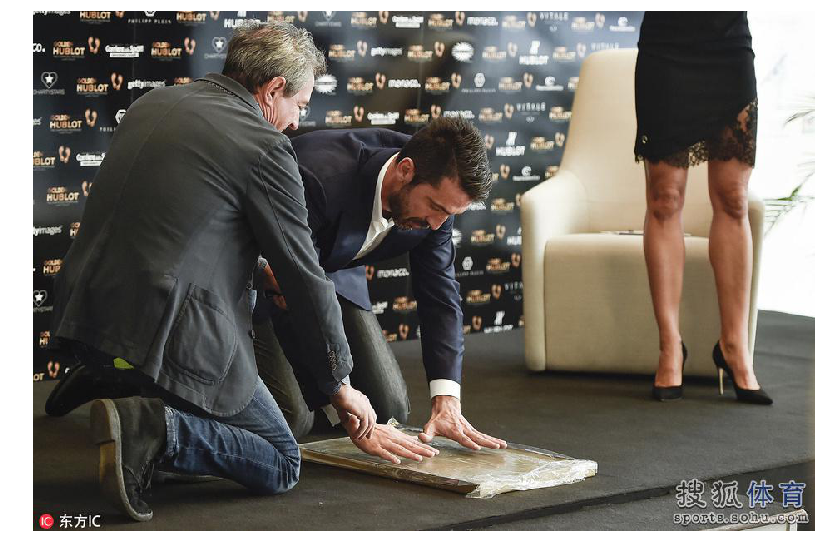

屋子里 有 一个 穿着 西装 的 男人 在 和 一个 坐在 沙发 上 的 男人 交谈 </S> 0.00897486


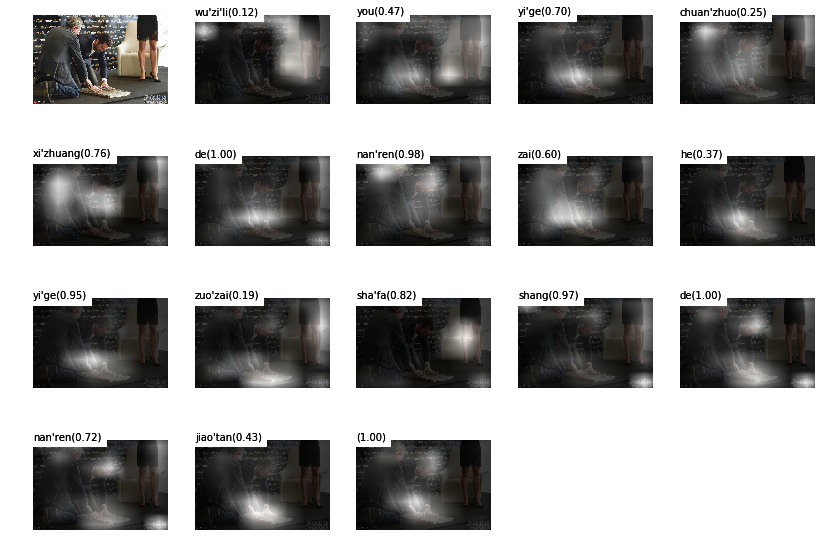

beam search using time(ms): 2790.17210007
室内 一个 穿着 西装 的 男人 在 给 一个 穿着 西装 的 男人 系鞋带 </S> 0.00872646


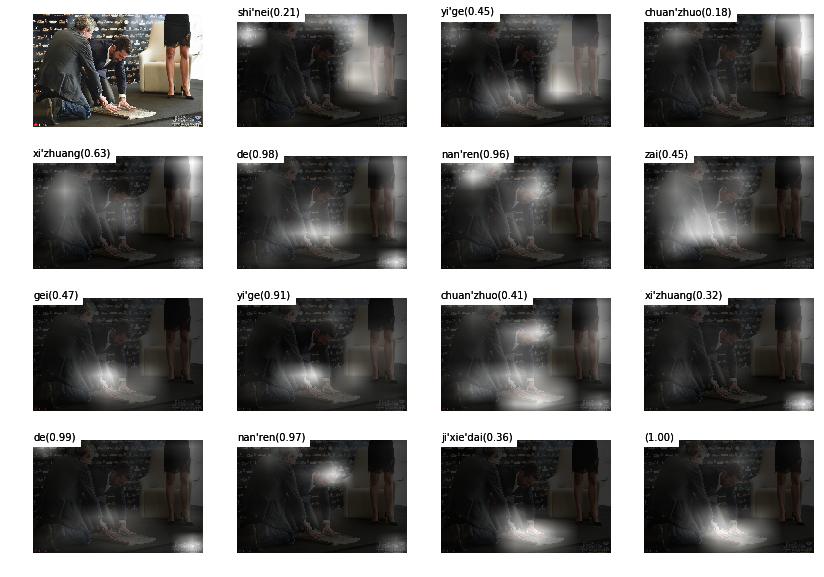

beam search using time(ms): 1608.8449955
房间 里 有 一个 穿着 西装 的 男人 在 和 一个 坐在 沙发 上 的 男人 交谈 </S> 0.00685739


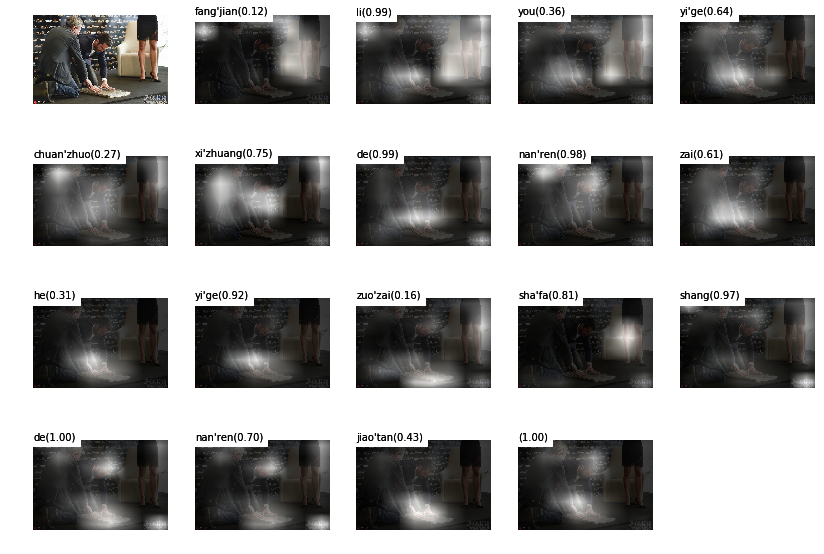

beam search using time(ms): 1771.38590813
屋子里 有 一个 穿着 西装 的 男人 在 和 一个 坐在 沙发 上 的 男人 说话 </S> 0.00657946


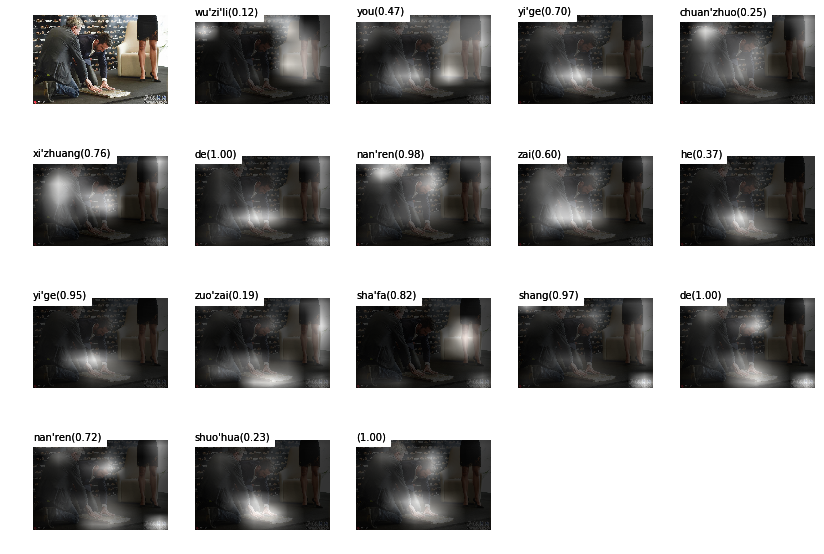

beam search using time(ms): 1678.78103256
房间 里 有 一个 穿着 西装 的 男人 和 一个 穿着 裙子 的 女人 在 交谈 </S> 0.00634206


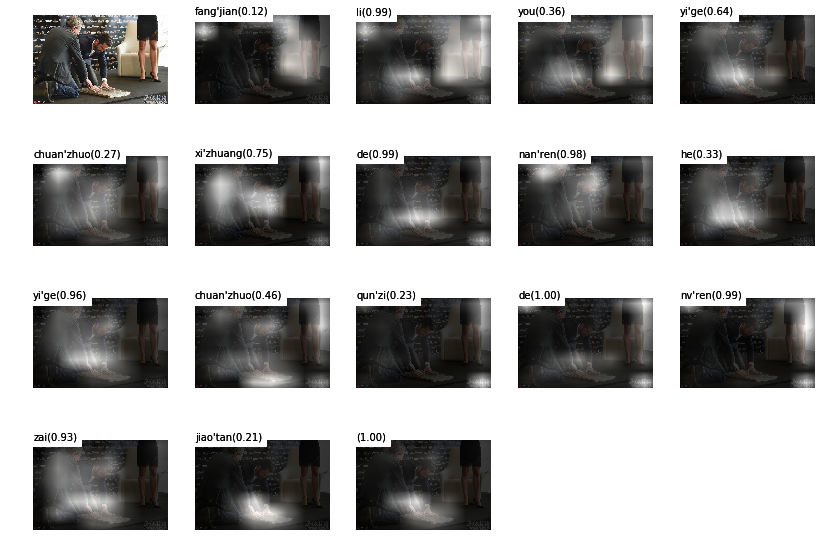

beam search using time(ms): 1683.14599991
房间 里 有 一个 弯着腰 的 男人 在 给 一个 坐在 沙发 上 的 男人 穿鞋 </S> 0.0058992


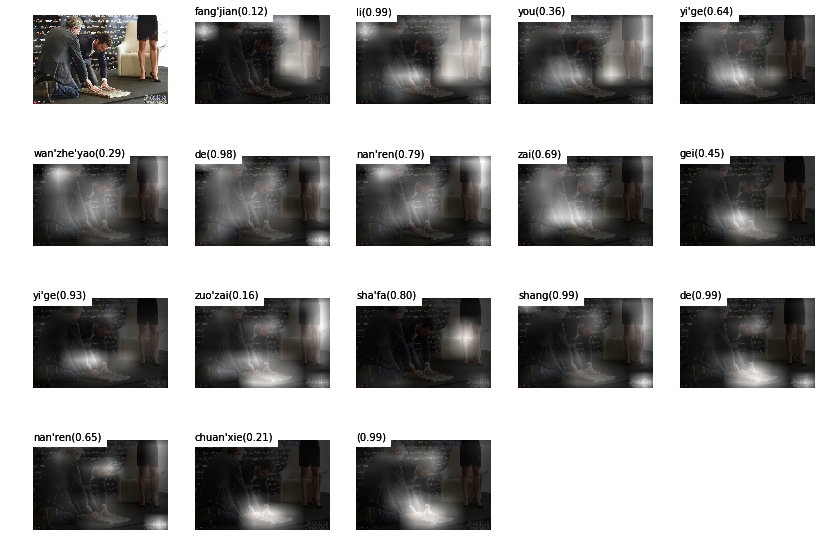

beam search using time(ms): 1678.24602127
房间 里 有 一个 穿着 西装 的 男人 在 给 一个 坐在 沙发 上 的 男人 穿鞋 </S> 0.00505691


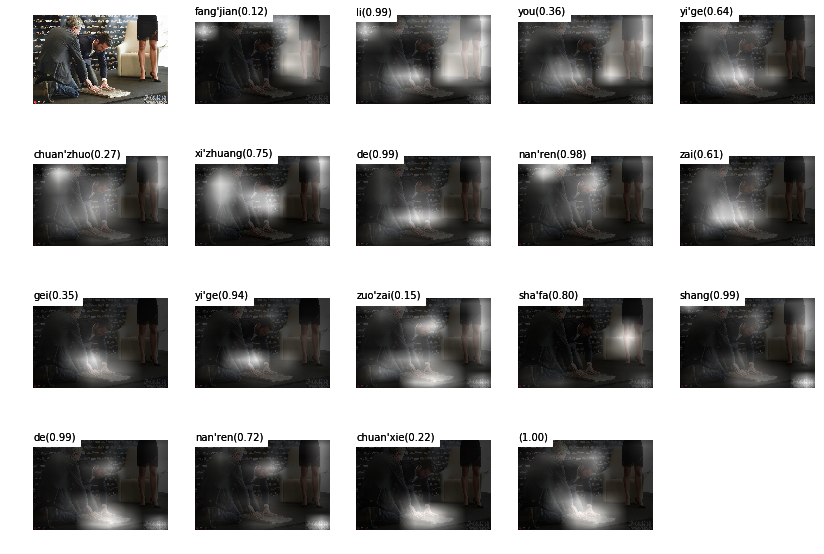

beam search using time(ms): 1770.86496353
房间 里 有 一个 穿着 西装 的 男人 在 和 一个 坐在 沙发 上 的 男人 说话 </S> 0.00484311


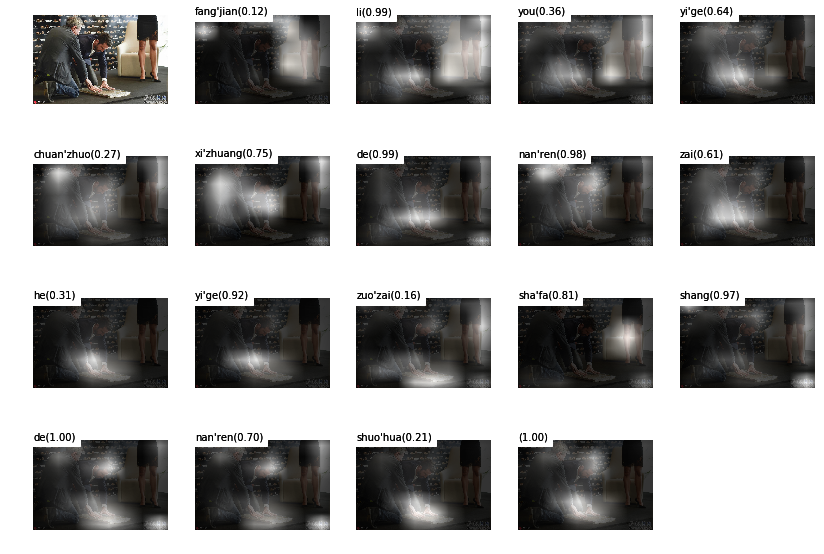

beam search using time(ms): 1776.40104294
房间 里 有 一个 穿着 西装 的 男人 在 给 一个 坐在 沙发 上 的 男人 系鞋带 </S> 0.00473469


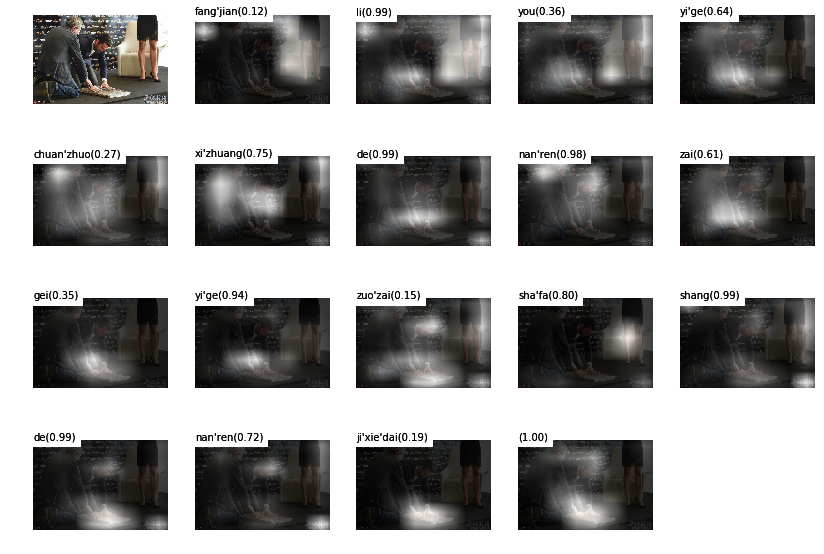

beam search using time(ms): 1774.89805222
房间 里 有 一个 穿着 西装 的 男人 和 一个 穿着 裙子 的 女人 在 整理 鞋子 </S> 0.0043281


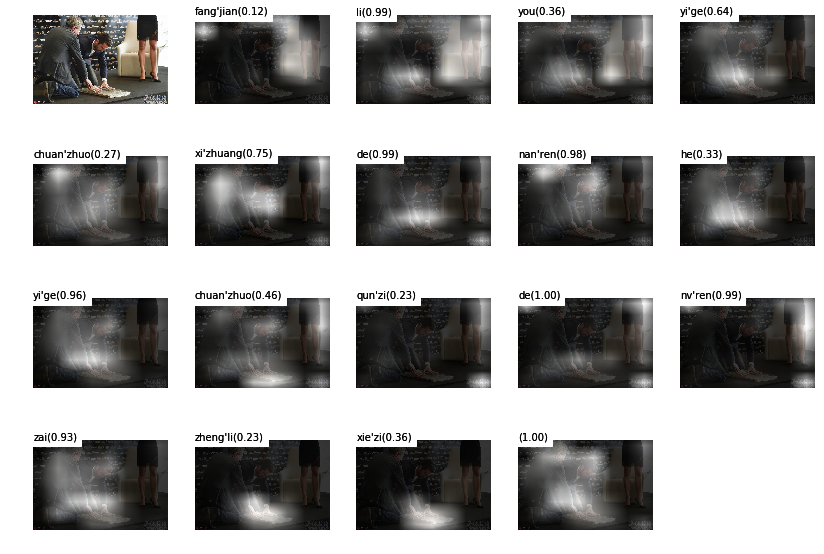

beam search using time(ms): 2326.38287544
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 5d6d8d52590866a98e3c72fa3f5a7ee7ea9c9681


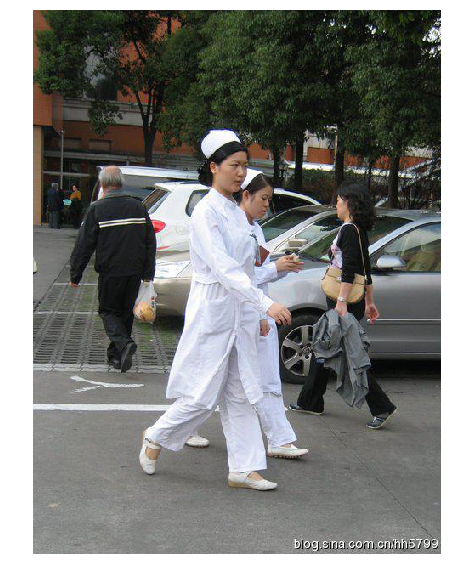

三个 人 的 旁边 有 一个 戴着 帽子 的 女人 走 在 道路 上 </S> 0.0245394


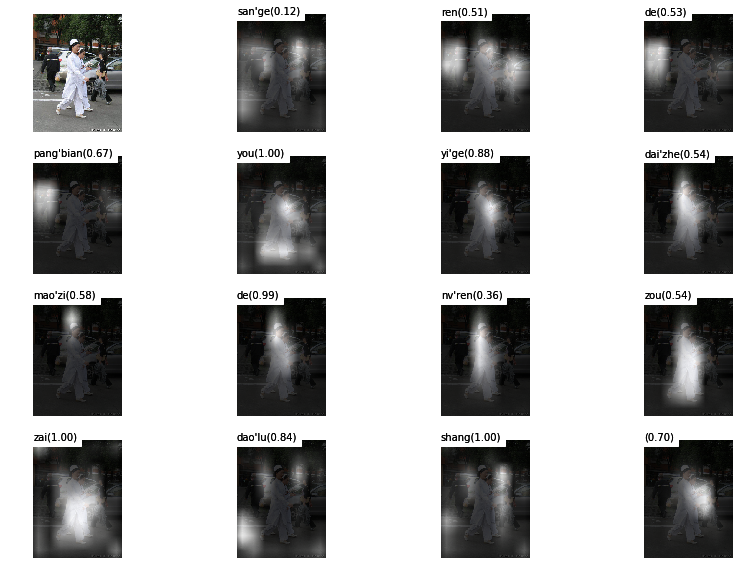

beam search using time(ms): 1751.32989883
三个 人 的 旁边 有 一个 戴着 帽子 的 女人 走 在 道路 上 的 汽车 旁 </S> 0.0180794


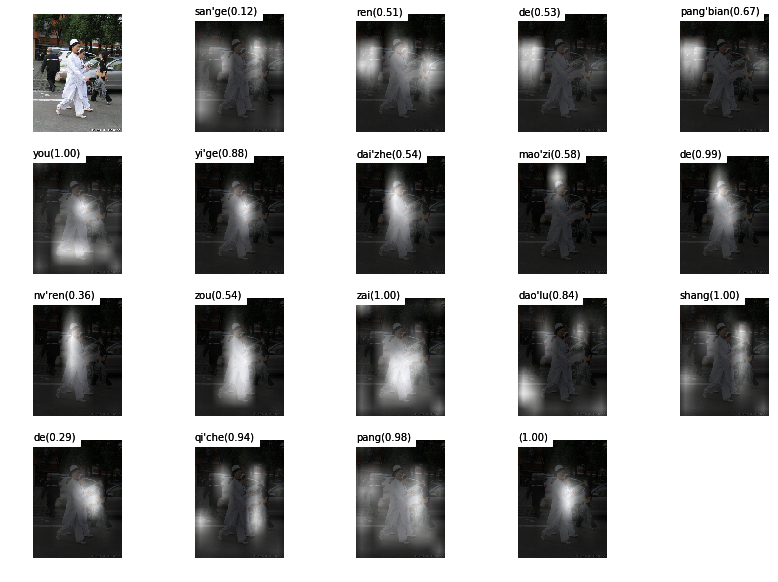

beam search using time(ms): 1353.16610336
三个 人 的 旁边 有 一个 戴着 帽子 的 护士 走 在 道路 上 </S> 0.0173645


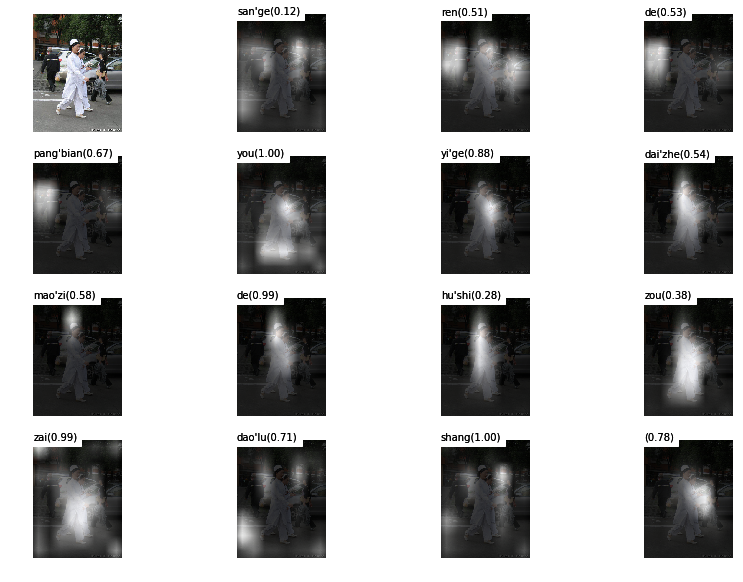

beam search using time(ms): 1139.16301727
两个 人旁 有 一个 戴着 帽子 的 护士 和 一个 戴着 帽子 的 护士 走 在 道路 上 </S> 0.0126214


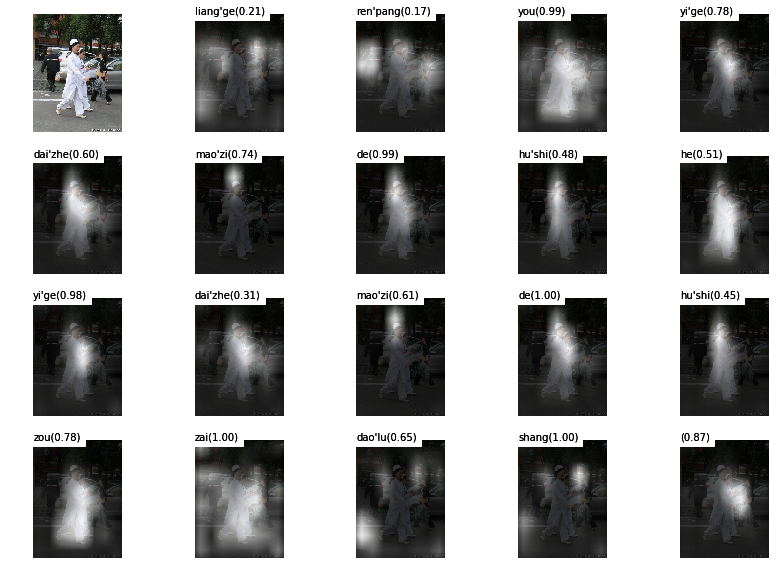

beam search using time(ms): 1421.38695717
两个 人旁 有 一个 戴着 帽子 的 护士 和 一个 戴着 帽子 的 女人 走 在 道路 上 </S> 0.0113278


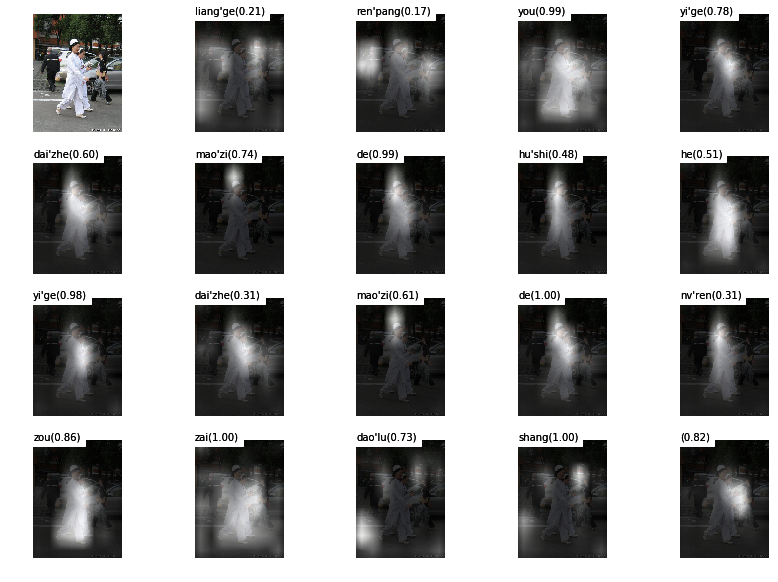

beam search using time(ms): 1420.67098618
三个 人 的 旁边 有 一个 戴着 帽子 的 护士 走 在 道路 上 的 汽车 旁 </S> 0.0105352


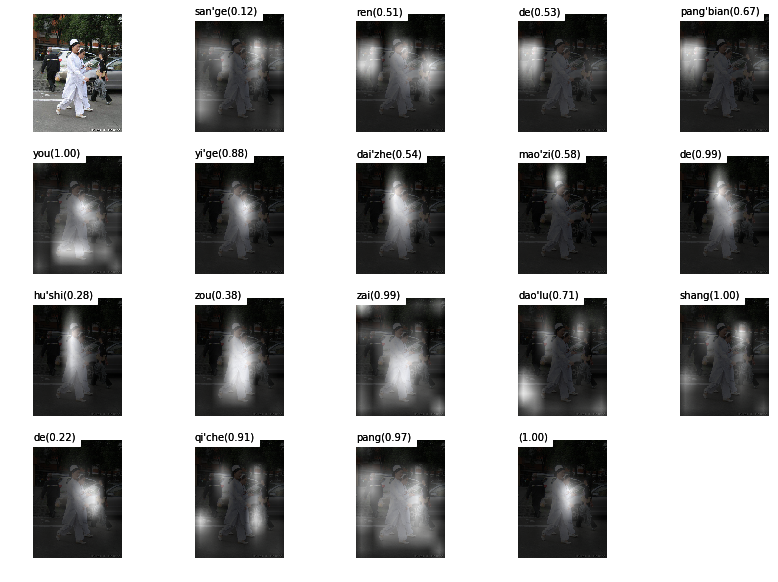

beam search using time(ms): 1347.4240303
两个 人 旁边 有 一个 戴着 帽子 的 护士 和 一个 戴着 帽子 的 女人 走 在 道路 上 </S> 0.00883391


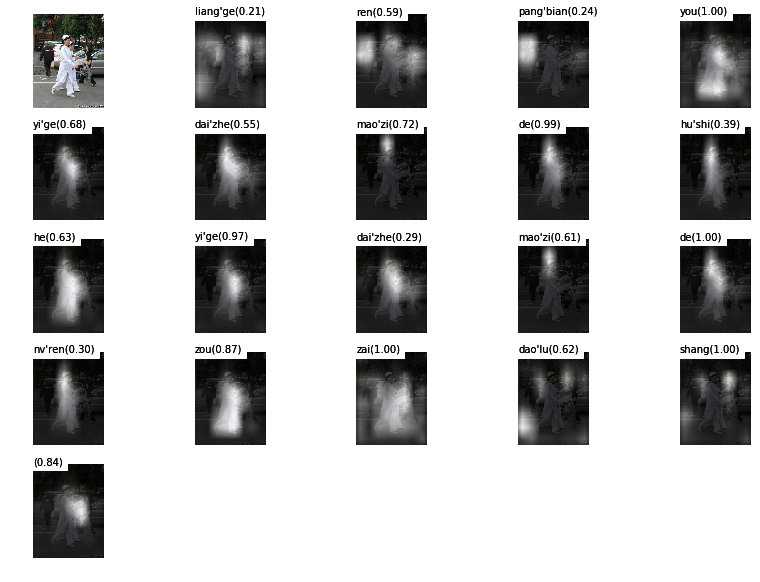

beam search using time(ms): 1413.55395317
两个 人 旁边 有 一个 戴着 帽子 的 护士 和 一个 戴着 帽子 的 护士 走 在 道路 上 </S> 0.00868862


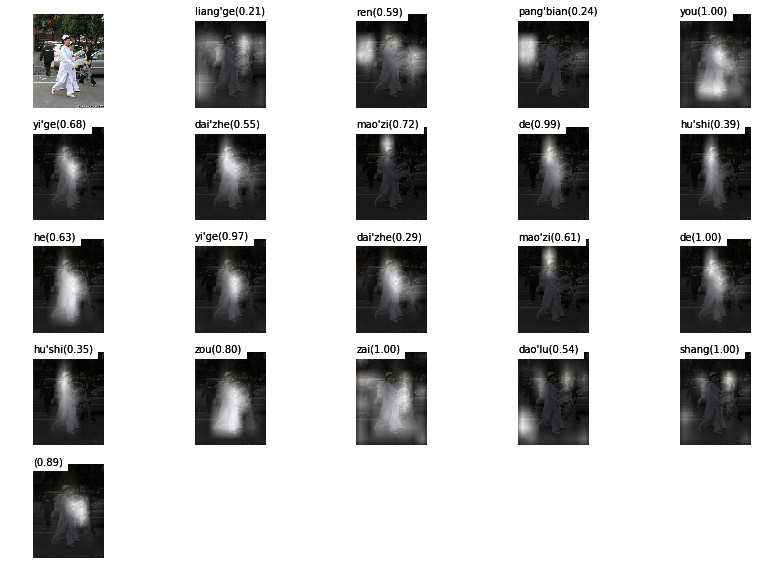

beam search using time(ms): 1419.72494125
两个 人 的 旁边 有 一个 戴着 帽子 的 女人 和 一个 戴着 帽子 的 女人 走 在 道路 上 </S> 0.00853796


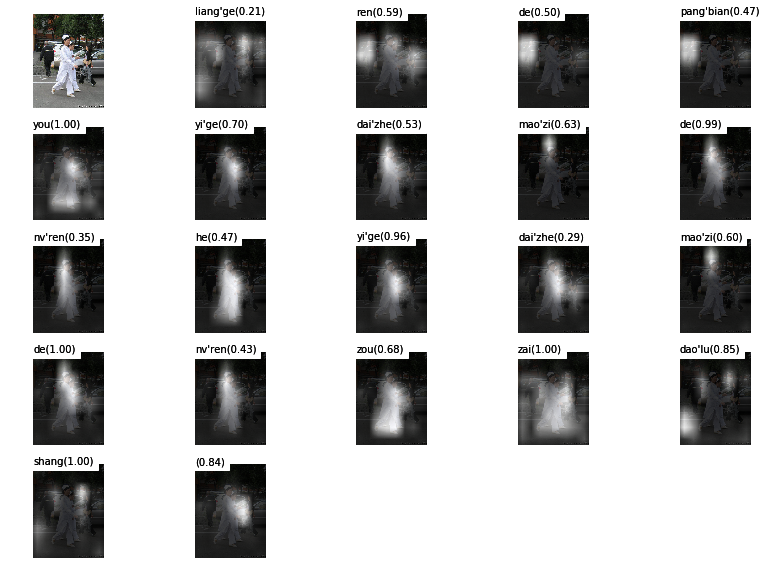

beam search using time(ms): 1483.4690094
两个 人 的 旁边 有 一个 戴着 帽子 的 护士 和 一个 戴着 帽子 的 女人 走 在 道路 上 </S> 0.00787863


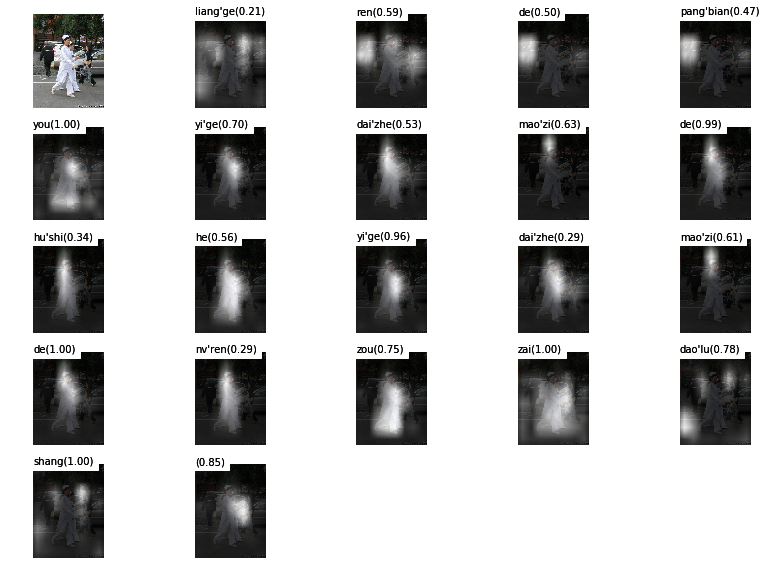

beam search using time(ms): 2042.03796387


In [ ]:
while True:
  image_name = raw_input('image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: ')
  image_name = image_name.strip().replace('file://', '')
  if image_name == 'q':
    break
  if not image_name.endswith('.jpg'):
    image_name += '.jpg'

  image_path = os.path.join(image_dir, image_name)

  if not os.path.exists(image_path):
    print('path not exists:%s'%image_path)
    image_path = image_name
    if not os.path.exists(image_path):
        continue
  #plt.subplot(1, 1, 1)
  #image_show(image_path)
  IMAGE_SIZE = (14, 10)
  #plt.subplot(1, 1, 1)  
  plt.figure(figsize=IMAGE_SIZE)
  image_show(image_path)

  predict(image_path, predictor)
  #predict(image_path, predictor2, gen_feature=False)

In [ ]:
import glob 
for img in glob.glob('/home/gezi/new2/data/ai_challenger/image_caption/test_pic/*.jpg'):
    image_show(img)
    predict(img, predictor)